In [1]:
import jax
import jax.numpy as jnp
import sklearn
import sklearn.datasets

import optax

import matplotlib.pyplot as plt
from IPython.display import clear_output, display

from ott import datasets
from ott.geometry import costs, pointcloud

from ott.tools import sinkhorn_divergence

import jax
import jax.numpy as jnp
from ott.geometry.geometry import Geometry
from ott.problems.linear import linear_problem
from ott.solvers.linear import sinkhorn
import scipy
import numpy as np

from typing import Any, Optional

import matplotlib.pyplot as plt
from matplotlib import colors

from ott.geometry import costs, pointcloud
from ott.problems.linear import linear_problem, potentials
from ott.solvers import linear
from ott.tools import progot
import scipy

In [2]:
from scipy.stats import pearsonr, spearmanr
from scipy.spatial import distance
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics.cluster import adjusted_rand_score, adjusted_mutual_info_score
import numpy as np
import json
import torch
from scipy.spatial import distance
import sys
import importlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
filehandle_embryo = '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E12.5_E13.5/'

sys.path.insert(0, filehandle_embryo)
sys.path.insert(0, '/home/ph3641/WDM/WDM/')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'On device: {device}')
dtype = torch.float64

def plot_slice_value(value_vec, spatial, vmax=None, vmin=None, center=False, center_val=None, s=6):
    """
    Parameters: 
    slice: AnnData object of the slice
    value_vec: growth vector

    Returns:
    Plots the slice with each spot colored according to its value in value_vec
    """
    if center:
        if center_val is None:
            cmin = vmin - (vmax-vmin)/2
            cmax = vmax + (vmax-vmin)/2
        else:
            cmin = vmin - center_val
            cmax = vmax + center_val
    else:
        cmin = vmin
        cmax = vmax
    plt.figure()
    sc = plt.scatter(spatial[:, 0], spatial[:, 1], c=value_vec, cmap='YlGn', s=s, vmin=cmin, vmax=cmax) # or 'RdYlGn'
    cbar = plt.colorbar(sc)
    cbar.ax.tick_params(labelsize=20)
    plt.gca().invert_yaxis()
    plt.axis('off')

    fig = plt.gcf()
    fig_size = fig.get_size_inches()
    new_width = 20.0
    new_height = new_width * (fig_size[1] / fig_size[0])
    fig.set_size_inches(new_width, new_height)
    plt.axis('equal')
    plt.show()
    return


@jax.jit
def sinkhorn_loss(
    x: jnp.ndarray, y: jnp.ndarray, epsilon: float = 0.001
) -> float:
    """Computes transport between (x, a) and (y, b) via Sinkhorn algorithm."""
    a = jnp.ones(len(x)) / len(x)
    b = jnp.ones(len(y)) / len(y)
    
    _, out = sinkhorn_divergence.sinkhorn_divergence(
        pointcloud.PointCloud, x, y, epsilon=epsilon, a=a, b=b
    )
    
    return out.divergence


def run_progot(
    x: jnp.ndarray, y: jnp.ndarray, cost_fn: costs.TICost, **kwargs: Any
) -> progot.ProgOTOutput:
    geom = pointcloud.PointCloud(x, y, cost_fn=cost_fn)
    prob = linear_problem.LinearProblem(geom)
    estim = progot.ProgOT(**kwargs)
    out = estim(prob)
    return out

K = 4
cost_fn = costs.SqEuclidean()

On device: cpu


In [3]:
import scanpy as sc
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

'''
'/scratch/gpfs/ph3641/mouse_embryo/E9.5_E1S1.MOSTA.h5ad', \
                        '/scratch/gpfs/ph3641/mouse_embryo/E10.5_E1S1.MOSTA.h5ad', \
, \'/scratch/gpfs/ph3641/mouse_embryo/E11.5_E1S1.MOSTA.h5ad'
                      '/scratch/gpfs/ph3641/mouse_embryo/E12.5_E1S1.MOSTA.h5ad'
, '/scratch/gpfs/ph3641/mouse_embryo/E13.5_E1S1.MOSTA.h5ad', \
  '/scratch/gpfs/ph3641/mouse_embryo/E14.5_E1S1.MOSTA.h5ad', \
  '/scratch/gpfs/ph3641/mouse_embryo/E15.5_E1S1.MOSTA.h5ad'
 ]
'''

filehandles_embryo_adata = ['/scratch/gpfs/ph3641/mouse_embryo/E9.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E10.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E11.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E12.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E13.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E14.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E15.5_E1S1.MOSTA.h5ad', \
                           '/scratch/gpfs/ph3641/mouse_embryo/E16.5_E1S1.MOSTA.h5ad']

N = len(filehandles_embryo_adata)
Qs = [None]*(N)

key = 'annotation'

labels = []

for i in range(N-1, -1, -1):
    
    adata = sc.read_h5ad(filehandles_embryo_adata[i])
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    encoder = OneHotEncoder(sparse_output=False)
    ys_onehot = encoder.fit_transform(adata.obs[key].values.reshape(-1, 1))
    _Q = ys_onehot / np.sum(ys_onehot)
    labels.append(list(encoder.categories_[0]))
    _Q = torch.from_numpy(_Q).to(device).float()
    print(_Q.shape)
    Qs[i] = _Q

labels.reverse()

torch.Size([121767, 25])
torch.Size([113350, 26])
torch.Size([102519, 26])
torch.Size([77369, 19])
torch.Size([51365, 23])
torch.Size([30124, 19])
torch.Size([18408, 13])
torch.Size([5913, 12])


In [4]:
print(len(Qs))

8


In [5]:
#importlib.reload(util_LR)

filehandles_embryo = ['/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E9.5_E10.5/', \
                        '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E10.5_E11.5/', \
                        '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E11.5_E12.5/', \
                        '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E12.5_E13.5/', \
                          '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E13.5_E14.5/', \
                          '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E14.5_E15.5/', \
                         '/scratch/gpfs/ph3641/mouse_embryo_preprocessed/E15.5_E16.5/']

spatial_list = []
expr_list = []

for i in range(len(filehandles_embryo)):
    
    if i == 0:
        spatial = np.load(filehandles_embryo[i] + f'slice{1}_coordinates.npy')
        spatial_list.append(spatial)
    
    spatial = np.load(filehandles_embryo[i] + f'slice{2}_coordinates.npy')
    spatial_list.append(spatial)

    if i == 0:
        expr = np.load(filehandles_embryo[i] + f'slice{1}_feature.npy')
        expr_list.append(expr)
    
    expr = np.load(filehandles_embryo[i] + f'slice{2}_feature.npy')
    expr_list.append(expr)

In [ ]:
sys.path.insert(0, '../src/')

import ott
from ott.geometry import pointcloud, geometry
from ott.problems.linear import linear_problem
from ott.solvers.linear import sinkhorn, sinkhorn_lr
import rank_annealing
import HR_OT
import importlib
import FRLC
import util
importlib.reload(HR_OT)
importlib.reload(FRLC)

np.random.seed(seed=1)
torch.manual_seed(1)

p = 1

#iters_to_avg = 5

# Iterate over datasets
for i in range(2,len(filehandles_embryo)):

    print(f'Pair: {filehandles_embryo[i]} ')
    
    # Expression data
    x0, x1 = expr_list[i], expr_list[i+1]
    print(x1.shape)
    # Spatial data
    s0, s1 = spatial_list[i], spatial_list[i+1]
    
    n = min(x0.shape[0], x1.shape[0])
    if x1.shape[0] > n:
        selected_indices = np.random.choice(x1.shape[0], size=n, replace=False)
        x1 = x1[selected_indices]
        s1 = s1[selected_indices]
    
    assert x1.shape[0] == x0.shape[0], "Expression dataset sizes do not match!"
    assert s1.shape[0] == s0.shape[0], "Expression dataset sizes do not match!"

    print(f'Sample size = {n}')
    
    # Wasserstein-only
    # Define pairwise Dist Mat
    _X = torch.tensor(x0).float().to(device)
    _Y = torch.tensor(x1).float().to(device)

    # n, hierarchy_depth = 6, max_Q = int(2**10), max_rank = 16 up to 18k
    # n, hierarchy_depth = 6, max_Q = int(2**10), max_rank = 32 for 30k
    # n, hierarchy_depth = 6, max_Q = int(2**10), max_rank = 64 for up to 70k
    # n, hierarchy_depth = 6, max_Q = int(2**10), max_rank = 128 for 102k-113k
    
    '''
    try:
        rank_schedule = rank_annealing.optimal_rank_schedule( n, hierarchy_depth = 6, max_Q = int(2**10), max_rank = 128 )
    except Exception as e:
        # some might be prime, removing insignificant # points if fails
        # for 50, 70k removing 2 points
        # for 102k removing 4 points
        # for 113k removing 2 points
        _X, _Y = torch.tensor(x0[2:] ).float().to(device), torch.tensor(x1[2:] ).float().to(device) 
        n = n - 2
        print(n)
        rank_schedule = rank_annealing.optimal_rank_schedule( n, hierarchy_depth = 6, max_Q = int(2**10), max_rank = 128 )'''
    
    '''
    hrot_lr = HR_OT.HierarchicalRefinementOT.init_from_point_clouds(_X, _Y, rank_schedule, base_rank=1, device=device)
    #del _X, _Y
    F = hrot_lr.run(return_as_coupling=False)
    cost_hrot_lr = hrot_lr.compute_OT_cost()
    print(cost_hrot_lr)'''

    
    try:
        C = torch.cdist(_X, _Y) ** p
    except Exception as e:
        print(f'Failed to load cost mat for sample size {n}: {e}')
        continue
        
    geom_xy = ott.geometry.geometry.Geometry(cost_matrix=C.cpu().numpy()) 
    #pointcloud.PointCloud(x0, x1, cost_fn=ott.geometry.costs.Euclidean()) # only runs first pair of datasets
    
    ot_prob = linear_problem.LinearProblem(geom_xy)
    solver = sinkhorn_lr.LRSinkhorn(rank=40)
    ot_lr = solver(ot_prob)
    cost_lot = ot_lr.primal_cost
    print(f'cost: {cost_lot:.4f}')
    '''
    try:
        geom = Geometry(C.cpu().numpy())
        ot_problem = linear_problem.LinearProblem(geom)
        solver = sinkhorn.Sinkhorn()
        ot_solution = solver(ot_problem)
        P_sinkhorn = ot_solution.matrix
        cost_sink = (C.cpu().numpy() * P_sinkhorn).sum()
        print(f'Cost of Sinkhorn: {cost_sink}')
    except Exception as e:
        print(f'Sinkhorn failed for sample size {n}: {e}')

    try:
        x_train, y_train = x0, x1
        alphas = progot.get_alpha_schedule("exp", num_steps=K)
        out = run_progot(x0, x1, cost_fn, alphas=alphas, epsilons=None)
        P_progOT_default = out.get_output(-1).matrix
        cost_progOT = (C.cpu().numpy() * P_progOT_default).sum()
        print(f'Cost of ProgOT: {cost_progOT}')
    except Exception as e:
        print(f'ProgOT failed for sample size {n}: {e}')
    '''

    '''
    #try:
    # FRLC
    C1, C2 = util.low_rank_distance_factorization(_X,_Y, r=40, eps=0.04, device=device)
    # Normalize appropriately
    c = ( C1.max()**1/2 ) * ( C2.max()**1/2 )
    C1, C2 = C1/c, C2/c
    C_factors = (C1.to(_X.dtype), C2.to(_X.dtype))
    Q, R, diagG, errs = FRLC.FRLC_LR_opt(C_factors,
                                         A_factors=None, 
                                         B_factors=None,
                                       gamma=30,
                                       r = 40,
                                       max_iter=60,
                                       device=device,
                                       min_iter = 25,
                                       max_inneriters_balanced=100,
                                       max_inneriters_relaxed=40,
                                       diagonalize_return=True,
                                       printCost=True, tau_in=100000,
                                        dtype = _X.dtype)
    
    print(f'FRLC cost: {errs['W_cost'][-1] * c**2}')'''
    
    

Pair: /scratch/gpfs/ph3641/mouse_embryo_preprocessed/E11.5_E12.5/ 
(51365, 60)
Sample size = 30124
cost: 21.6432
Pair: /scratch/gpfs/ph3641/mouse_embryo_preprocessed/E12.5_E13.5/ 
(77369, 60)
Sample size = 51365


In [ ]:
costs = {
    'HROT_LR': {'samples': [5913, 18408, 30124, 51363, 77367, 102519, 113350], 
                'costs': [21.8088, 14.8126, 16.1396, 14.5741, 13.7851, 14.2901, 12.7880
                         ]},
    'Sinkhorn': {'samples': [5913, 18408], 
                 'costs': [21.9137, 14.8893]},
    'ProgOT': {'samples': [5913, 18408],
               'costs': [22.5607, 15.3539]},
    'FRLC': {'samples': [5913, 18408, 30124, 51363, 77367, 102519, 113350],
               'costs': [23.1443, 16.0926, 17.7380, 15.4707, 14.6422, 15.5055, 14.0034
               ]}
}

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 5.832061576029568e-28, GW-cost: 1.938746764729588e-24, Total cost: 7.770225027423551e-28
Final Wasserstein cost: 5.492847534924644e-28, GW-cost: 1.848586274150068e-24, Total cost: 7.34088420567611e-28


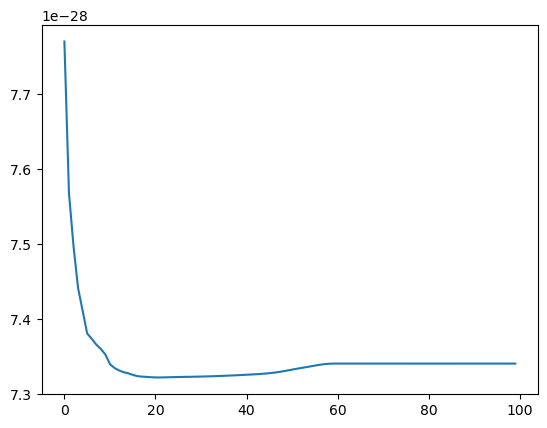

Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Initial Wasserstein cost: 2.983756114509161e-28, GW-cost: 1.6354015448947472e-24, Total cost: 4.618859081714258e-28
Final Wasserstein cost: 2.7468655276433157e-28, GW-cost: 1.5153029941011847e-24, Total cost: 4.261893744311917e-28


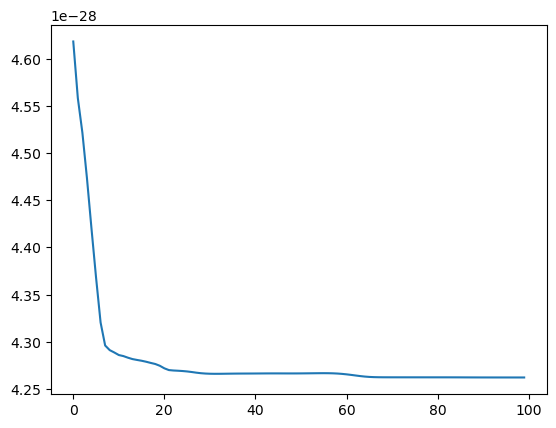

total number of tab colors that can be displayed: 60
total number of unique values: 77


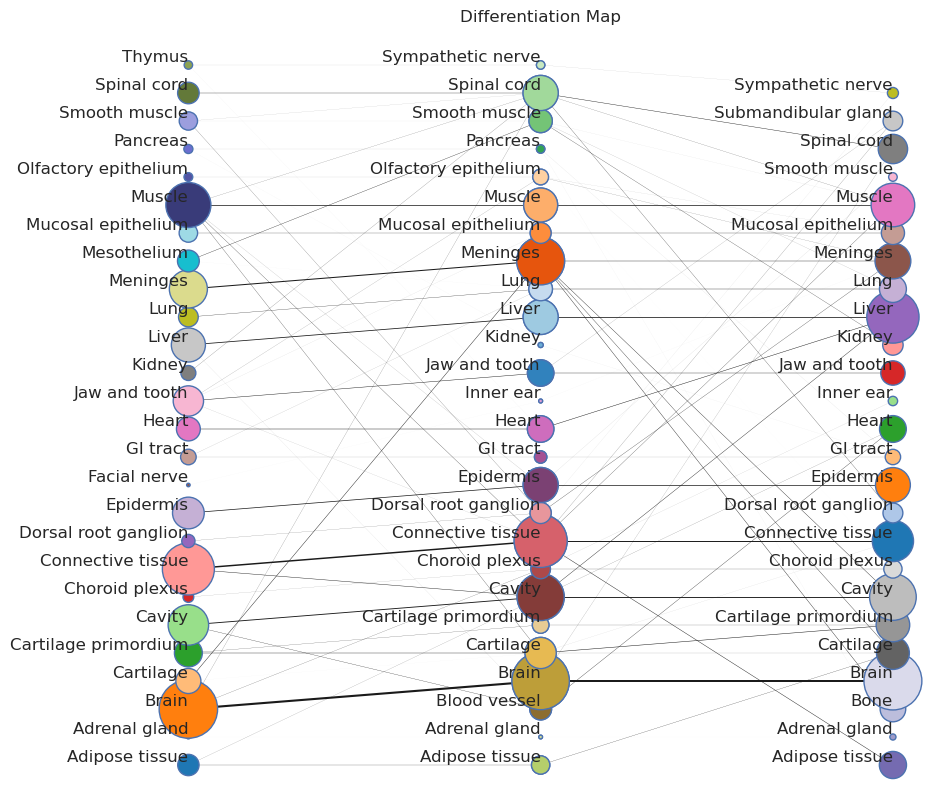

total number of tab colors that can be displayed: 60
total number of unique values: 77


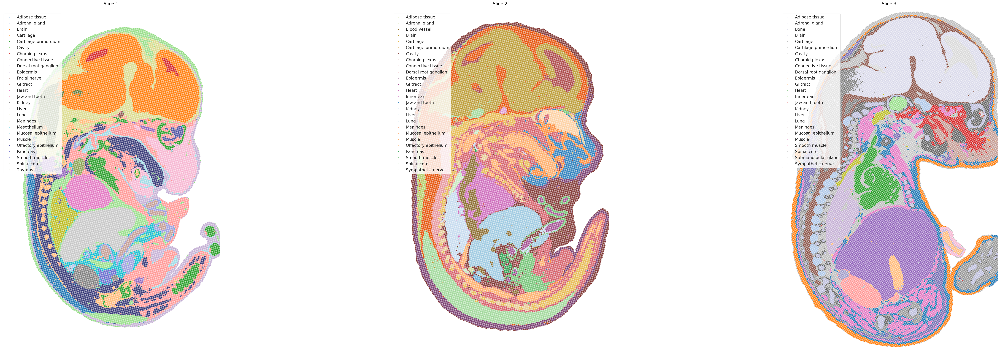

In [ ]:
'''
def independence_ratio(T12, T23, g_Q2, g_Q1, g_Q3, labels1, labels3, diagonal=False):
    ct_to_IR = { }
    set1, set3 = set(labels1), set(labels3)
    labels_intersection = set1.intersection(set3)
    for label in labels_intersection:
        idx_k = labels1.index(label)
        idx_l = labels3.index(label)
        #print(f'{label}: {idx_k} to {idx_l}')
        vec = (T12[idx_k, :] * T23[:, idx_l]) / g_Q2
        ct_to_IR[label] = torch.sum(vec) / (g_Q1[idx_k] * g_Q3[idx_l])
    return ct_to_IR
'''

gamma=40 #40
tau_out=5
tau_in=1e-5
alpha = 0.0001
beta = 0.0
max_iter=100
min_iter=100

WDM = WassersteinDiffMap.WassersteinDifferentiationMapping(rank_list, tau_in = tau_in, tau_out=tau_out, \
                              gamma=gamma, max_iter=100, min_iter=100, device=device, dtype=torch.float32, \
                             printCost=True, returnFull=False, alpha=alpha, beta=beta, \
                              initialization='Full', init_args = None)
WDM.impute_annotated_transitions(C_factors_sequence, A_factors_sequence, Qs)

Ts_ann = [T.cpu().numpy() for T in WDM.T_gammas]

Qs_ann = [Q.cpu().numpy() for Q in Qs]

del WDM

clustering.diffmap_from_QT(Qs_ann, Ts_ann, labels, dsf=0.1)

clustering.plot_clusters_from_QT(spatial_list, Qs_ann, Ts_ann, labels, flip=True, dotsize=10)
clustering.plot_clusters_from_QT(spatial_list, Qs_ann, Ts_ann, [None, None, None, labels[-1]], clustering_type='reference', reference_index=2, flip=True, dotsize=10)
clustering.plot_clusters_from_QT(spatial_list, Qs_ann, Ts_ann, [labels[0], None, None, None], clustering_type='reference', reference_index=0, flip=True, dotsize=10)
